<a href="https://colab.research.google.com/github/DABallentine/knowledge_discovery_charlotte/blob/Imad/Charlotte_MAPS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Charlotte 311 Service Request Analysis

<h1> <b> Exploring Charlotte Shape Files </b> </h1>

## Data Import and Survey

In [ ]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('ggplot')

In [ ]:
# Function to read data from URL
def read_data_from_URL(url):
    df=pd.read_csv(url)
    return df

In [ ]:
# Read in the data
serv_req_url='https://bitbucket.org/nthammad-uncc/test_repo/raw/7508681846896228bb87fd1989ec50ca2d592bc5/data/Service_Requests_311.csv'
requests = read_data_from_URL(serv_req_url)

## Initial Variable Selection


<b> The following variables will be dropped: </b>
<ol>
<li> X - redundant with X_COORD </li>
<li> Y - redundant with Y_COORD </li>
<li> FISCAL YEAR - redundant with RECEIVED_DATE </li>
<li> FISCAL MONTH - redundant with RECEIVED_DATE </li>
<li> TITLE - redundant with REQUEST_TYPE </li>
<li> CMPD_DIVISION - too many missing values </li>
<li> STREET_DIRECTION - redundant </li>
<li> STREET_NAME - redundant </li>
<li> STREET_TYPE - redundant </li>
<li> CITY - redundant </li>
<li> STATE - redundant </li>
<li> COUNCIL_DISTRICT - too many missing values </li>
<li> GLOBAL_ID - no predictive value </li>
<li> PID - no predictive value </li>
<li> SHAPE - all missing </li>
</ol>

In [ ]:
requests.drop(requests.iloc[:, [0,1,4,6,7,11,12,15,16,17,18,19,26,27,28,29]], axis=1, inplace=True)
requests.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1631510 entries, 0 to 1631509
Data columns (total 14 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   OBJECTID                    1631510 non-null  int64  
 1   DEPARTMENT                  1631510 non-null  object 
 2   REQUEST_NO                  1631510 non-null  int64  
 3   REQUEST_TYPE                1631510 non-null  object 
 4   RECEIVED_DATE               1631510 non-null  object 
 5   INTERNAL_FIELD_OBSERVATION  1631510 non-null  object 
 6   NEIGHBORHOOD_PROFILE_AREA   1559062 non-null  float64
 7   BLOCK_NO                    1587157 non-null  float64
 8   ZIP_CODE                    1586427 non-null  float64
 9   FULL_ADDRESS                1624342 non-null  object 
 10  X_COORD                     1559084 non-null  float64
 11  Y_COORD                     1559084 non-null  float64
 12  LATITUDE                    1559077 non-null  float64
 1

In [ ]:
# Drop all records which are missing addresses or LATITUDE and LONGITUDE
print('Size before dropping records:', requests.shape)
start_size = requests.shape[0]
requests = requests[~requests['FULL_ADDRESS'].isnull() & 
                    ~requests['ZIP_CODE'].isnull() &
                    ~requests['LATITUDE'].isnull() & 
                    ~requests['LONGITUDE'].isnull() &
                    ~requests['NEIGHBORHOOD_PROFILE_AREA'].isnull()]
num_nulls = start_size - requests.shape[0]
print('Size after dropping {dropped} records:'.format(dropped = num_nulls), requests.shape)

Size before dropping records: (1631510, 14)
Size after dropping 99185 records: (1532325, 14)


In [ ]:
# Divide categories by season of the year
requests['RECEIVED_DATE'] = pd.to_datetime(requests['RECEIVED_DATE'], format='%Y/%m/%d %H:%M')
requests['SEASON'] = requests['RECEIVED_DATE'].dt.quarter

# Create new columns in the requests dataset for month and year
requests['RECEIVED_MONTH']= pd.to_datetime(requests['RECEIVED_DATE']).dt.month
requests['RECEIVED_YEAR']= pd.to_datetime(requests['RECEIVED_DATE']).dt.year

In [ ]:
requests.isna().sum()

OBJECTID                      0
DEPARTMENT                    0
REQUEST_NO                    0
REQUEST_TYPE                  0
RECEIVED_DATE                 0
INTERNAL_FIELD_OBSERVATION    0
NEIGHBORHOOD_PROFILE_AREA     0
BLOCK_NO                      0
ZIP_CODE                      0
FULL_ADDRESS                  0
X_COORD                       0
Y_COORD                       0
LATITUDE                      0
LONGITUDE                     0
SEASON                        0
RECEIVED_MONTH                0
RECEIVED_YEAR                 0
dtype: int64

# Mapping GeoData

In [ ]:
# to read and visualize spatial data
! pip install geopandas
import geopandas as gpd

! pip install contextily
import contextily as ctx

! pip install descartes
import descartes

In [ ]:
# Covert our merged_requests_df dataframe into a Geopandas Dataframe
# We will set a Coordinate reference systems (CRS) using Longitude and Latitude in our 311 data set

geo_requests = gpd.GeoDataFrame(requests, 
                                crs = 'EPSG:4326',
                                geometry = gpd.points_from_xy(requests.LONGITUDE, 
                                                              requests.LATITUDE))



In [ ]:
# Confirm reproject to CRS = EPSG 4326 (Map with Long/Lat)
geo_requests = geo_requests.to_crs(epsg=4326)



In [ ]:
# convert lat/lon to floats
geo_requests.LONGITUDE = geo_requests.LONGITUDE.astype('float')
geo_requests.LATITUDE = geo_requests.LATITUDE.astype('float')



In [ ]:
# drop the unmapped rows - anything that has a longitude of 0 should be removed
geo_requests = geo_requests[geo_requests.LONGITUDE!=0]
geo_requests = geo_requests[geo_requests.LATITUDE!=0]



In [ ]:
# Check for missing values
geo_requests.isna().sum()

OBJECTID                      0
DEPARTMENT                    0
REQUEST_NO                    0
REQUEST_TYPE                  0
RECEIVED_DATE                 0
INTERNAL_FIELD_OBSERVATION    0
NEIGHBORHOOD_PROFILE_AREA     0
BLOCK_NO                      0
ZIP_CODE                      0
FULL_ADDRESS                  0
X_COORD                       0
Y_COORD                       0
LATITUDE                      0
LONGITUDE                     0
SEASON                        0
RECEIVED_MONTH                0
RECEIVED_YEAR                 0
geometry                      0
dtype: int64

In [ ]:
geo_requests.head()

,OBJECTID,DEPARTMENT,REQUEST_NO,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,SEASON,RECEIVED_MONTH,RECEIVED_YEAR,geometry
0,1,Solid Waste Services,6402056,NON_RECYCLABLE ITEMS,2016-11-07 14:25:00+00:00,N,215.0,3601.0,28226.0,"3601 KNAPDALE LN, CHARLOTTE, NC 28226",1458251.0,508075.0,35.132444,-80.812089,4,11,2016,POINT (-80.81209 35.13244)
1,2,Housing and NBHD Serv,6402064,UTILITY VERIFICATION LTR,2016-11-07 14:28:00+00:00,N,265.0,4124.0,28269.0,"4124 SILVERMERE WY, CHARLOTTE, NC 28269",1468687.0,587226.0,35.350408,-80.781941,4,11,2016,POINT (-80.78194 35.35041)
2,3,Solid Waste Services,6402082,NON_RECYCLABLE ITEMS,2016-11-07 14:34:00+00:00,N,103.0,523.0,28213.0,"523 GRAHAM MEADOW DR, CHARLOTTE, NC 28213",1471481.0,562513.0,35.282654,-80.771094,4,11,2016,POINT (-80.77109 35.28265)
3,4,Solid Waste Services,6402103,MISSED RECYCLING,2016-11-07 14:41:00+00:00,N,158.0,1801.0,28216.0,"1801 CRANDON DR, CHARLOTTE, NC 28216",1438992.0,568604.0,35.297745,-80.880327,4,11,2016,POINT (-80.88033 35.29775)
5,6,Finance/City,6402112,CWP REQUEST,2016-11-07 14:45:00+00:00,N,88.0,309.0,28208.0,"309 JONES ST APT 1, CHARLOTTE, NC 28208",1439454.0,552715.0,35.254120,-80.877772,4,11,2016,POINT (-80.87777 35.25412)


In [ ]:
# get the bounding box coordinates for the 311 calls data
minx, miny, maxx, maxy = geo_requests.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)





-85.56829116
-80.55847037
35.01303165
35.51069535


In [ ]:

# mount and connect my drive to access shape files 

from google.colab import drive
drive.mount('/content/gdrive')



Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Shape File 1: Zip Codes

In [ ]:
# IMPORT SHAPE FILE FOR MAPPING
charlotte_zipcode_map = gpd.read_file('/content/gdrive/MyDrive/Charlotte 311 Calls Project/Data/zipcode/Zipcode.shp')


In [ ]:
# Layers into a web mercator projection
# reproject to web mercator
charlotte_zipcode_map = charlotte_zipcode_map.to_crs(epsg=4326)

In [ ]:
charlotte_zipcode_map.head()

,objectid_1,zip,po_name,shape_Leng,shape_Area,geometry
0,1,28269,CHARLOTTE,153090.308851,8.290439e+08,"POLYGON ((-80.76429 35.40021, -80.75676 35.395..."
1,2,28075,HARRISBURG,10472.133974,2.431967e+06,"POLYGON ((-80.71290 35.35803, -80.71232 35.357..."
2,3,28206,CHARLOTTE,70381.941476,1.956278e+08,"POLYGON ((-80.79411 35.27656, -80.79445 35.274..."
3,4,28214,CHARLOTTE,175023.225545,9.583438e+08,"POLYGON ((-80.96258 35.34683, -80.96205 35.345..."
4,5,28120,MOUNT HOLLY,7280.707178,1.026388e+06,"POLYGON ((-80.98476 35.33617, -80.98521 35.336..."


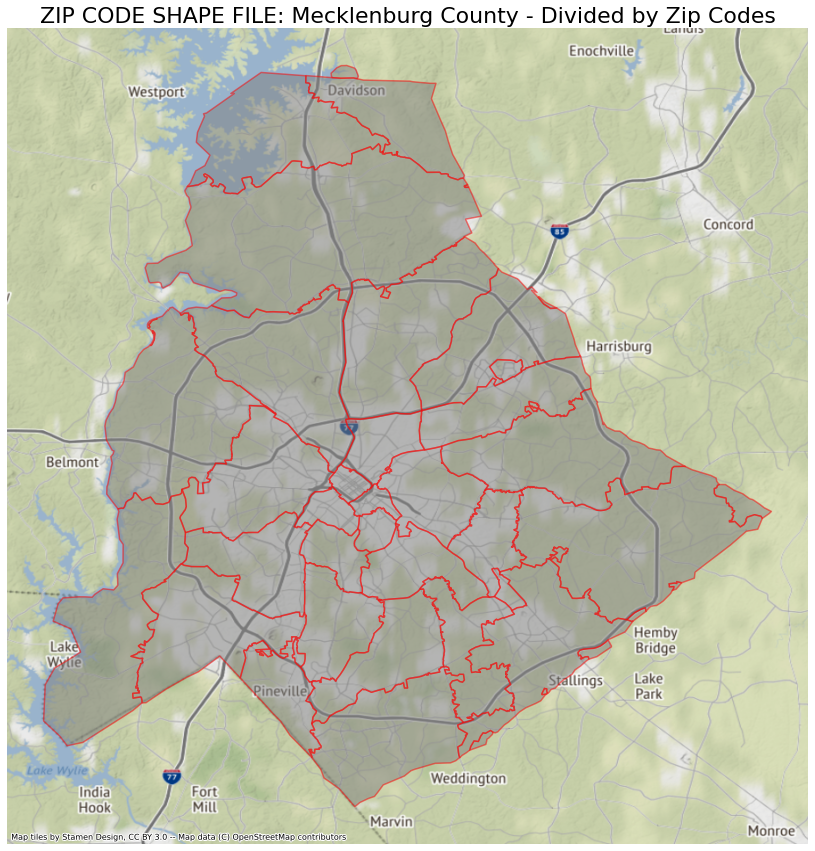

In [ ]:
# Checking out what a plot looks like
fig, ax = plt.subplots(figsize=(15,15))

charlotte_zipcode_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='red',
                            lw=1.5,
                            alpha=0.5)

# no axis
ax.axis('off')
ax.set_title('ZIP CODE SHAPE FILE: Mecklenburg County - Divided by Zip Codes',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = charlotte_zipcode_map.crs.to_string())

# Shape File 2: County Jurisdictions

In [ ]:
# IMPORT SHAPE FILE FOR MAPPING
county_juris = gpd.read_file('/content/gdrive/MyDrive/Charlotte 311 Calls Project/Data/County_jurisdictions/Jurisdictions.shp')

In [ ]:
# Layers into a web mercator projection
# reproject to web mercator
county_juris = county_juris.to_crs(epsg=4326)

In [ ]:
county_juris.head()

,objectid_1,name,nme_juris,shape_Leng,shape_Area,geometry
0,1,Davidson,DAVI,3589.104839,5.553649e+05,"POLYGON ((-80.81557 35.46920, -80.81640 35.468..."
1,2,Mecklenburg,MECK,1013.314873,3.277362e+04,"POLYGON ((-80.86020 35.47002, -80.86048 35.469..."
2,3,Huntersville,HUNT,7732.663960,3.235768e+06,"POLYGON ((-80.80005 35.42699, -80.79910 35.426..."
3,4,Mecklenburg,MECK,1556.824608,1.496339e+05,"POLYGON ((-80.92257 35.37958, -80.92256 35.378..."
4,5,Mecklenburg,MECK,3367.015007,5.924606e+05,"POLYGON ((-80.68363 35.20530, -80.68324 35.205..."


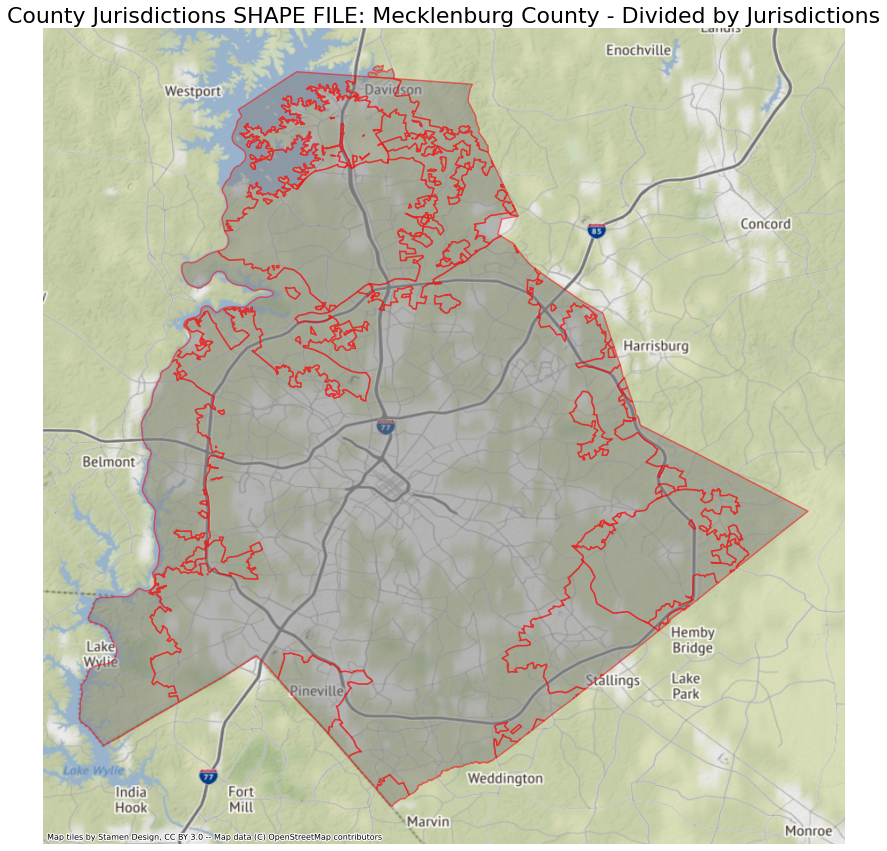

In [ ]:
# Checking out what a plot looks like
fig, ax = plt.subplots(figsize=(15,15))

county_juris.plot(ax=ax,
                  color='grey', 
                  edgecolor='red',
                  lw=1.5,
                  alpha=0.5)

# no axis
ax.axis('off')
ax.set_title('County Jurisdictions SHAPE FILE: Mecklenburg County - Divided by Jurisdictions',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = county_juris.crs.to_string())

# Shape File 3: Block Groups

In [ ]:
# IMPORT SHAPE FILE FOR MAPPING
block_groups = gpd.read_file('/content/gdrive/MyDrive/Charlotte 311 Calls Project/Data/block_groups/acs2019_5yr_B01003_15000US371190057131.geojson')

In [ ]:
# Layers into a web mercator projection
# reproject to web mercator
block_groups = block_groups.to_crs(epsg=4326)

In [ ]:
block_groups.head()

,geoid,name,B01003001,"B01003001, Error",geometry
0,05000US37119,"Mecklenburg County, NC",1074475.0,0.0,"MULTIPOLYGON (((-80.75291 35.41560, -80.75241 ..."
1,15000US371190001001,"Block Group 1, Mecklenburg, NC",1714.0,278.0,"MULTIPOLYGON (((-80.85519 35.22279, -80.85444 ..."
2,15000US371190001002,"Block Group 2, Mecklenburg, NC",2095.0,315.0,"MULTIPOLYGON (((-80.84843 35.23180, -80.84739 ..."
3,15000US371190001003,"Block Group 3, Mecklenburg, NC",1270.0,286.0,"MULTIPOLYGON (((-80.84507 35.22902, -80.84448 ..."
4,15000US371190001004,"Block Group 4, Mecklenburg, NC",83.0,81.0,"MULTIPOLYGON (((-80.84226 35.22777, -80.84194 ..."


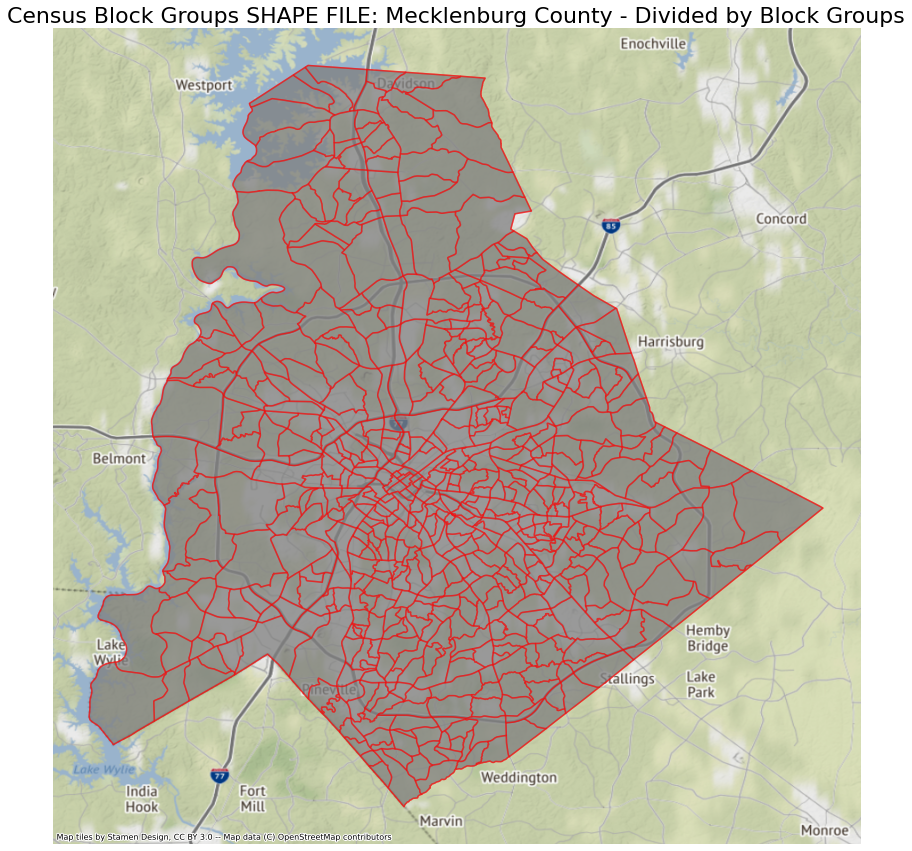

In [ ]:
# Checking out what a plot looks like
fig, ax = plt.subplots(figsize=(15,15))

block_groups.plot(ax=ax,
                  color='grey', 
                  edgecolor='red',
                  lw=1.5,
                  alpha=0.5)

# no axis
ax.axis('off')
ax.set_title('Census Block Groups SHAPE FILE: Mecklenburg County - Divided by Block Groups',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = block_groups.crs.to_string())

# TESTING PLOTLY

In [ ]:
import plotly.express as px

In [ ]:
import json

In [ ]:
block_groups.head()

,geoid,name,B01003001,"B01003001, Error",geometry
0,05000US37119,"Mecklenburg County, NC",1074475.0,0.0,"MULTIPOLYGON (((-80.75291 35.41560, -80.75241 ..."
1,15000US371190001001,"Block Group 1, Mecklenburg, NC",1714.0,278.0,"MULTIPOLYGON (((-80.85519 35.22279, -80.85444 ..."
2,15000US371190001002,"Block Group 2, Mecklenburg, NC",2095.0,315.0,"MULTIPOLYGON (((-80.84843 35.23180, -80.84739 ..."
3,15000US371190001003,"Block Group 3, Mecklenburg, NC",1270.0,286.0,"MULTIPOLYGON (((-80.84507 35.22902, -80.84448 ..."
4,15000US371190001004,"Block Group 4, Mecklenburg, NC",83.0,81.0,"MULTIPOLYGON (((-80.84226 35.22777, -80.84194 ..."


In [ ]:
scope = ['CDOT POTHOLE REPAIR']

In [ ]:
df_new = geo_requests[geo_requests['REQUEST_TYPE'].isin(scope)]



In [ ]:
df_new.head()

,OBJECTID,DEPARTMENT,REQUEST_NO,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,SEASON,RECEIVED_MONTH,RECEIVED_YEAR,geometry
540,541,Transportation,6478025,CDOT POTHOLE REPAIR,2017-02-06 15:13:00+00:00,N,41.0,11709.0,28226.0,"11709 ROCK CANYON DR, CHARLOTTE, NC 28226",1444019.0,488064.0,35.076746,-80.858429,1,2,2017,POINT (-80.85843 35.07675)
548,549,Transportation,7212395,CDOT POTHOLE REPAIR,2018-11-13 17:30:00+00:00,N,132.0,1424.0,28209.0,"1424 CORTLAND RD EAST, CHARLOTTE, NC 28209",1446836.0,518966.0,35.161785,-80.850941,4,11,2018,POINT (-80.85094 35.16179)
1225,1226,Transportation,7104149,CDOT POTHOLE REPAIR,2018-08-11 21:19:00+00:00,N,7.0,4330.0,28211.0,"4330 FOXCROFT RD, CHARLOTTE, NC 28211",1456811.0,515596.0,35.153034,-80.817365,3,8,2018,POINT (-80.81736 35.15303)
1453,1454,Transportation,7110643,CDOT POTHOLE REPAIR,2018-08-15 22:08:00+00:00,N,356.0,14614.0,28277.0,"14614 JOCKEY'S RIDGE DR, CHARLOTTE, NC 28277",1443966.0,476915.0,35.046114,-80.857909,3,8,2018,POINT (-80.85791 35.04611)
1456,1457,Transportation,7110657,CDOT POTHOLE REPAIR,2018-08-15 22:15:32+00:00,N,153.0,10228.0,28262.0,"10228 CLAYBROOKE DR, CHARLOTTE, NC 28262",1478466.0,583246.0,35.339952,-80.748915,3,8,2018,POINT (-80.74892 35.33995)


In [ ]:
values = df_new['REQUEST_TYPE'].value_counts().tolist()

fips = block_groups['geoid']

In [45]:
Colorscale = ['#8B0000', '#B22222', '#DC143C', '#FF0000', '#FF6347', '#FF7F50', '#CD5C5C', '#F08080', 
              '#FA8072', '#FFA07A', '#FF4500', '#FF8C00', '#FFA500', '#FFD700', '#B8860B', '#DAA520', '#EEE8AA', 
              '#BDB76B', '#F0E68C', '#FFFF00', '#9ACD32', '#556B2F', '#7CFC00', '#7FFF00', '#ADFF2F', '#006400', 
              '#008000', '#228B22', '#00FF00', '#32CD32', '#90EE90', '#98FB98', '#8FBC8F', '#00FA9A', '#00FF7F', 
              '#2E8B57']

In [53]:
import geopandas
import shapely

import plotly
from plotly.figure_factory._county_choropleth import create_choropleth
import xlrd


In [55]:
fig = create_choropleth(
   fips=fips, values=values, colorscale=Colorscale, show_state_data=True,
    county_outline={'color': 'rgb(255,255,255)', 'width': 0.5}, 
    legend_title='% change', title='% Change in disease between 1980-2014')


ERROR:root:An unexpected error occurred while tokenizing input
The following traceback may be corrupted or invalid
The error message is: ('EOF in multi-line string', (1, 0))



ValueError: ignored

In [56]:
# SET UP SOMETHING TO FILTER BY FOR AN OVERLAY PLOT

# How to filter on 2 conditions
# df.loc[(df['Salary_in_1000']>=100) & (df['Age']< 60) & (df['FT_Team'].str.startswith('S')),['Name','FT_Team']]



# 311 Service Recycle requests plotted over various time scales

recy_year_2016 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2016) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2017 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2017) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2018 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2018) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2019 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2019) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2020 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2020) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2021 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2021) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_all = geo_requests.loc[(geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]


# 311 Service Recycle requests plotted over various time scales

non_recy_year_2016 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2016) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2017 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2017) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2018 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2018) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2019 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2019) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2020 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2020) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2021 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2021) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_all = geo_requests.loc[(geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]



# Block Group Confirmation

bgconf = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2021) 
& (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS') 
& (geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 384.0)]







In [57]:
# Find the Range of Neighborhood Profile Area
print('Range of Neighborhood_profile is ', geo_requests['NEIGHBORHOOD_PROFILE_AREA'].max() - geo_requests['NEIGHBORHOOD_PROFILE_AREA'].min() )

Range of Neighborhood_profile is  473.0


In [58]:
geo_requests['NEIGHBORHOOD_PROFILE_AREA'].max()

475.0

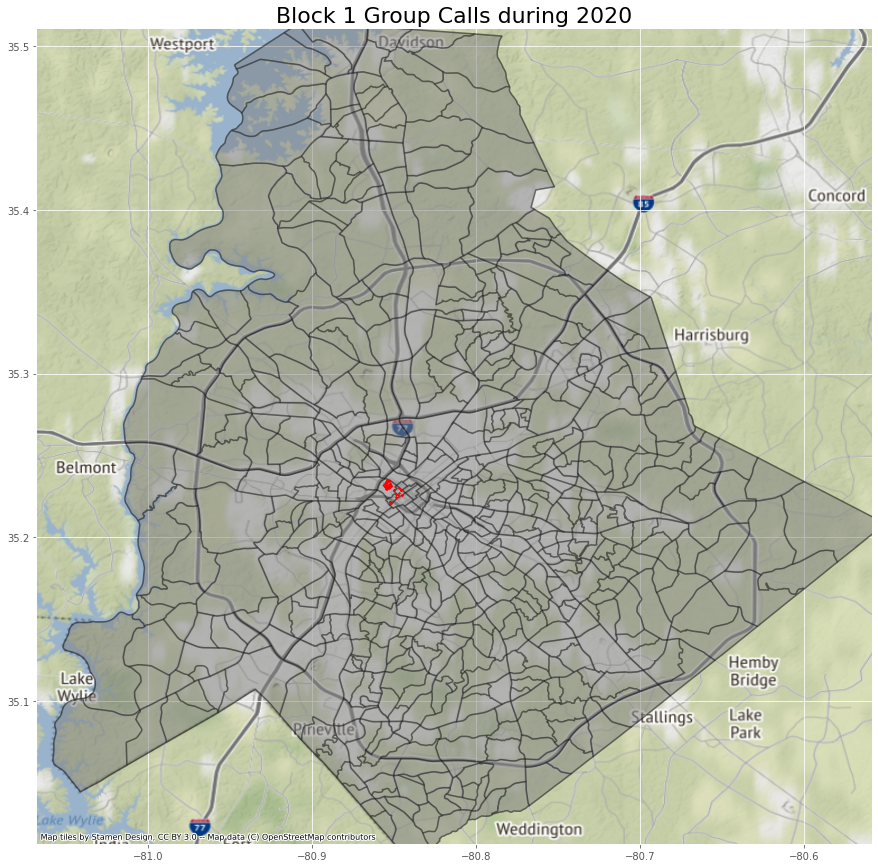

In [59]:
# Layering Calls From Block Code 1


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (block group shape file)
block_groups.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.3,
                            aspect=1)


# Plot 2 - Only Block 371.0 Recycle 311-Calls
bgconf.plot(ax=ax, 
                    color='red',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'Recyclable')

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('Block 1 Group Calls during 2020',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = block_groups.crs.to_string())

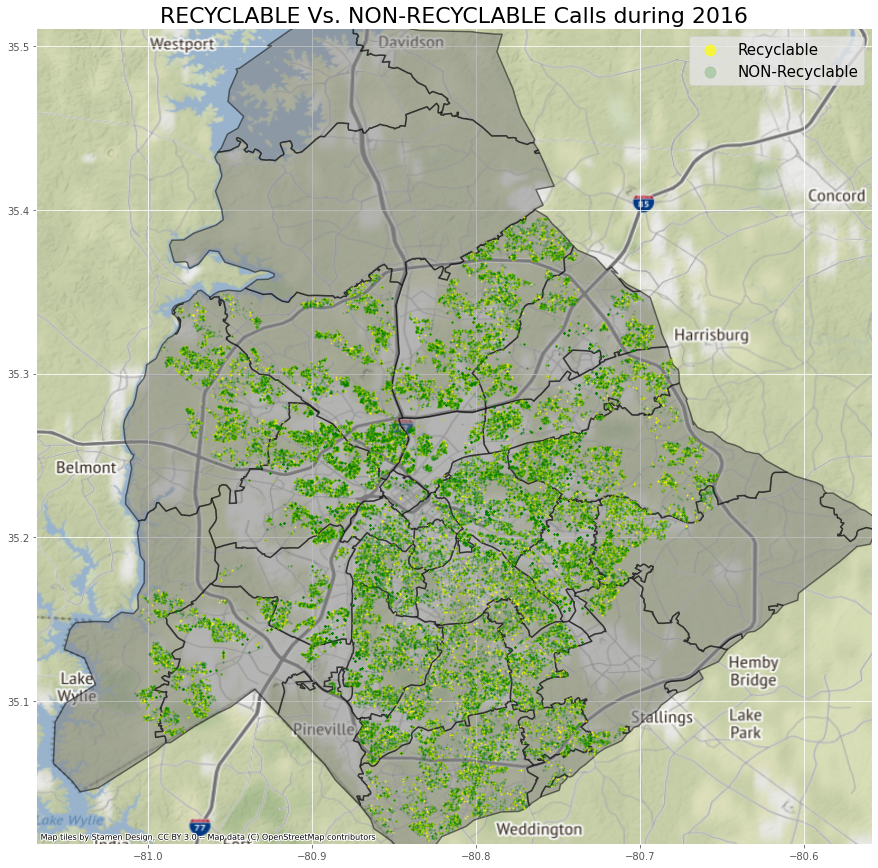

In [60]:
# Layering 2016 Recycle & Non Recycle requests onto the ZipCode Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
charlotte_zipcode_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all 2016 Recycle 311-Calls
recy_year_2016.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.7,
                    aspect = 1,
                    label = 'Recyclable')


# Plot 3 - Map all 2016 Non-Recycle 311-Calls
non_recy_year_2016.plot(ax=ax, 
                        color='green',
                        markersize=2,
                        alpha=0.2,
                        aspect = 1,
                        label = 'NON-Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('RECYCLABLE Vs. NON-RECYCLABLE Calls during 2016',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = charlotte_zipcode_map.crs.to_string())

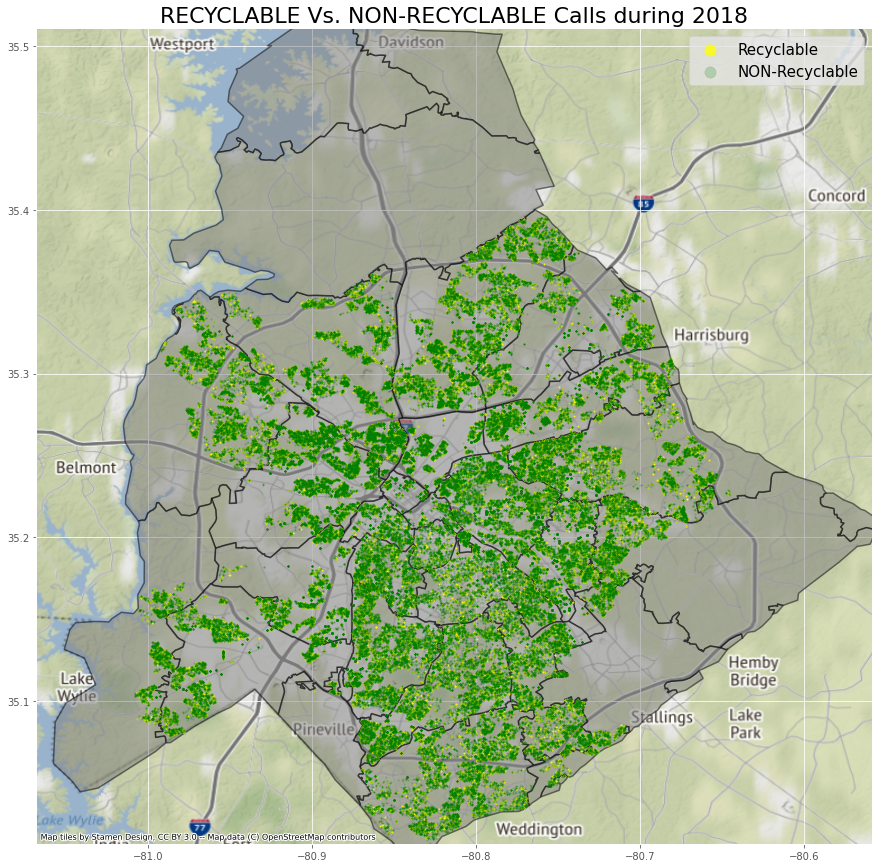

In [61]:
# Layering 2018 Recycle & Non Recycle requests onto the ZipCode Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
charlotte_zipcode_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all 2018 Recycle 311-Calls
recy_year_2018.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'Recyclable')


# Plot 3 - Map all 2018 Non-Recycle 311-Calls
non_recy_year_2018.plot(ax=ax, 
                        color='green',
                        markersize=2,
                        alpha=0.2,
                        aspect = 1,
                        label = 'NON-Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('RECYCLABLE Vs. NON-RECYCLABLE Calls during 2018',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = charlotte_zipcode_map.crs.to_string())

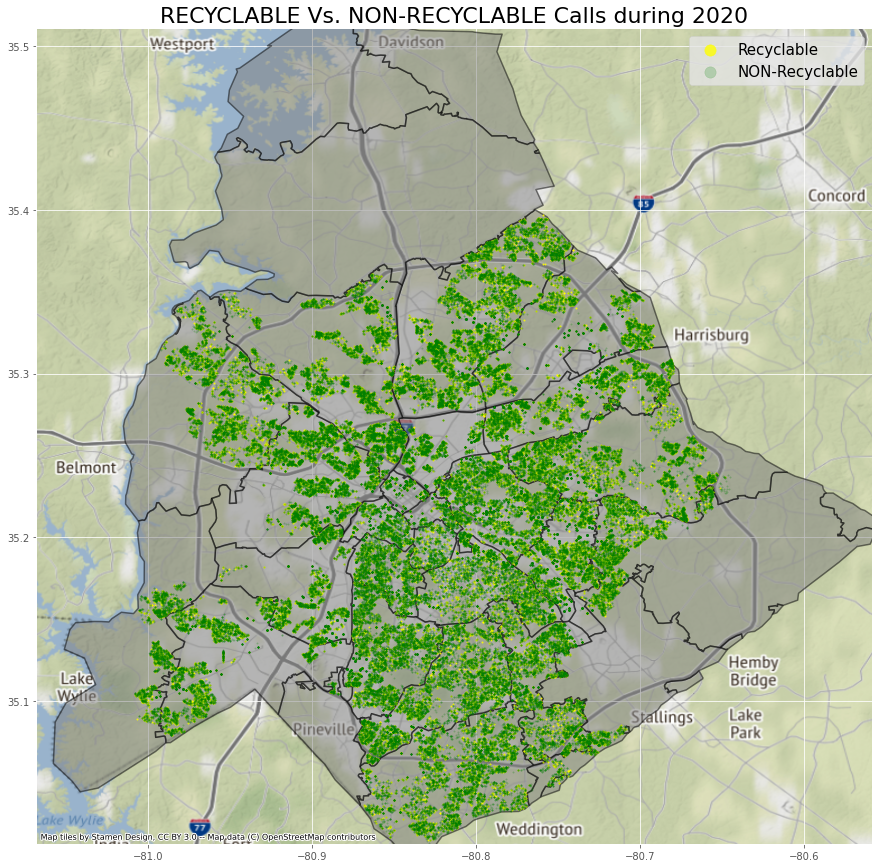

In [62]:
# Layering 2020 Recycle & Non Recycle requests onto the ZipCode Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
charlotte_zipcode_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all 2020 Recycle 311-Calls
recy_year_2020.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'Recyclable')


# Plot 3 - Map all 2020 Non-Recycle 311-Calls
non_recy_year_2020.plot(ax=ax, 
                        color='green',
                        markersize=2,
                        alpha=0.2,
                        aspect = 1,
                        label = 'NON-Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('RECYCLABLE Vs. NON-RECYCLABLE Calls during 2020',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = charlotte_zipcode_map.crs.to_string())

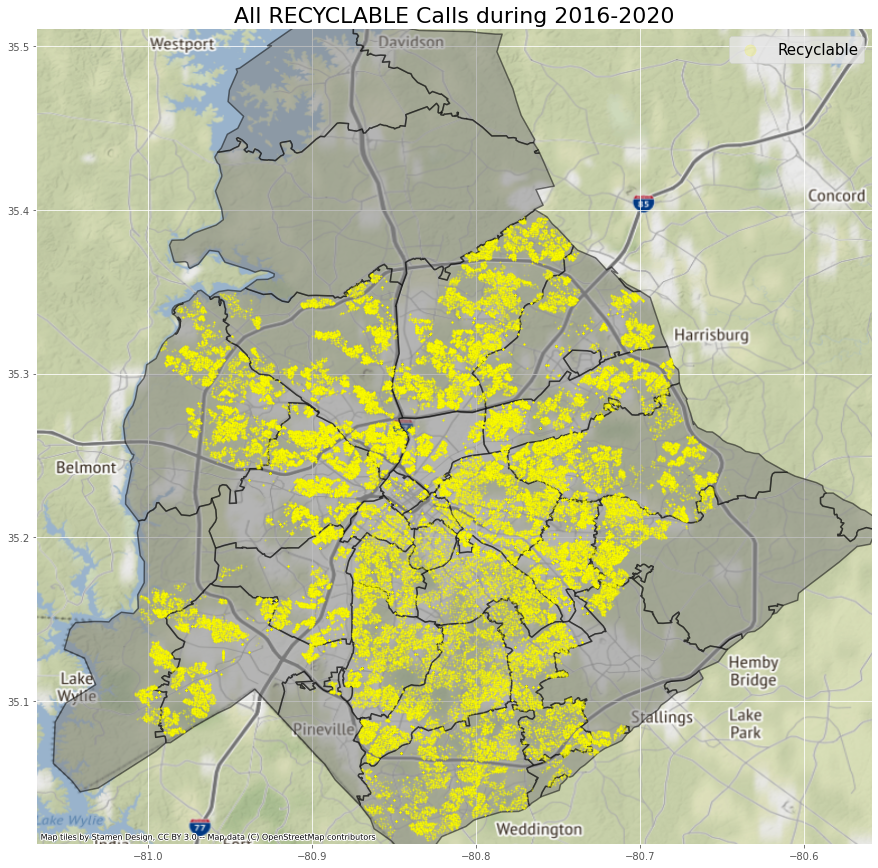

In [63]:
# Layering ALL Recycle requests onto the ZipCode Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
charlotte_zipcode_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all Recycle 311-Calls
recy_year_all.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.2,
                    aspect = 1,
                    label = 'Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('All RECYCLABLE Calls during 2016-2020',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = charlotte_zipcode_map.crs.to_string())

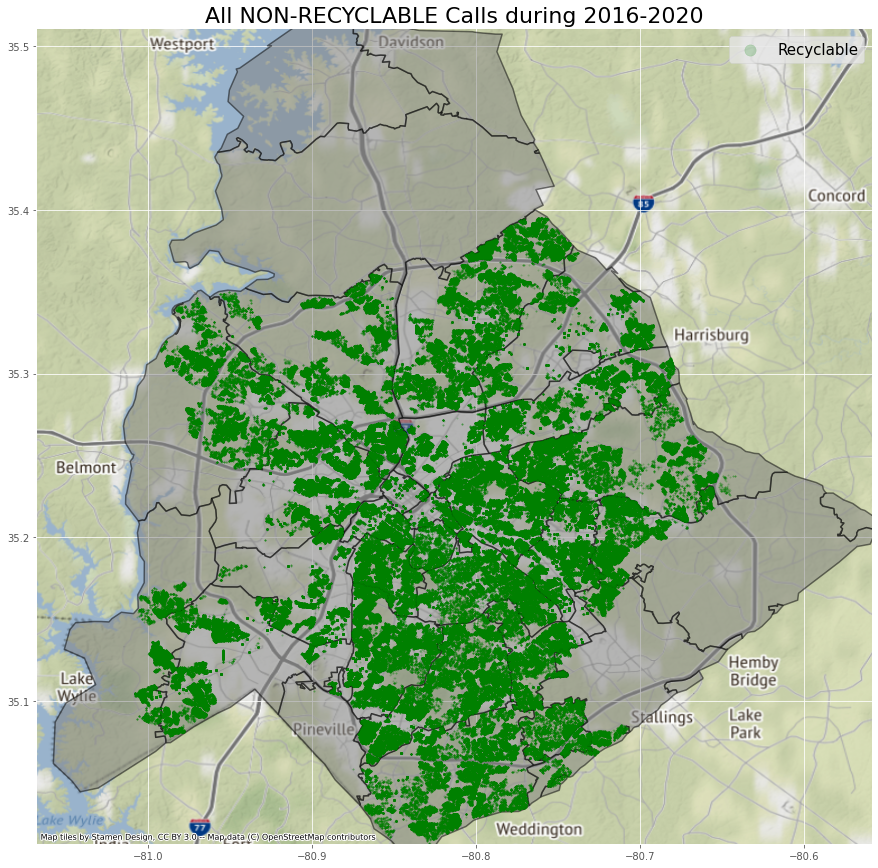

In [64]:
# Layering All Non-Recy requests onto the ZipCode Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
charlotte_zipcode_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all NON Recycle 311-Calls
non_recy_year_all.plot(ax=ax, 
                    color='green',
                    markersize=2,
                    alpha=0.2,
                    aspect = 1,
                    label = 'Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('All NON-RECYCLABLE Calls during 2016-2020',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = charlotte_zipcode_map.crs.to_string())

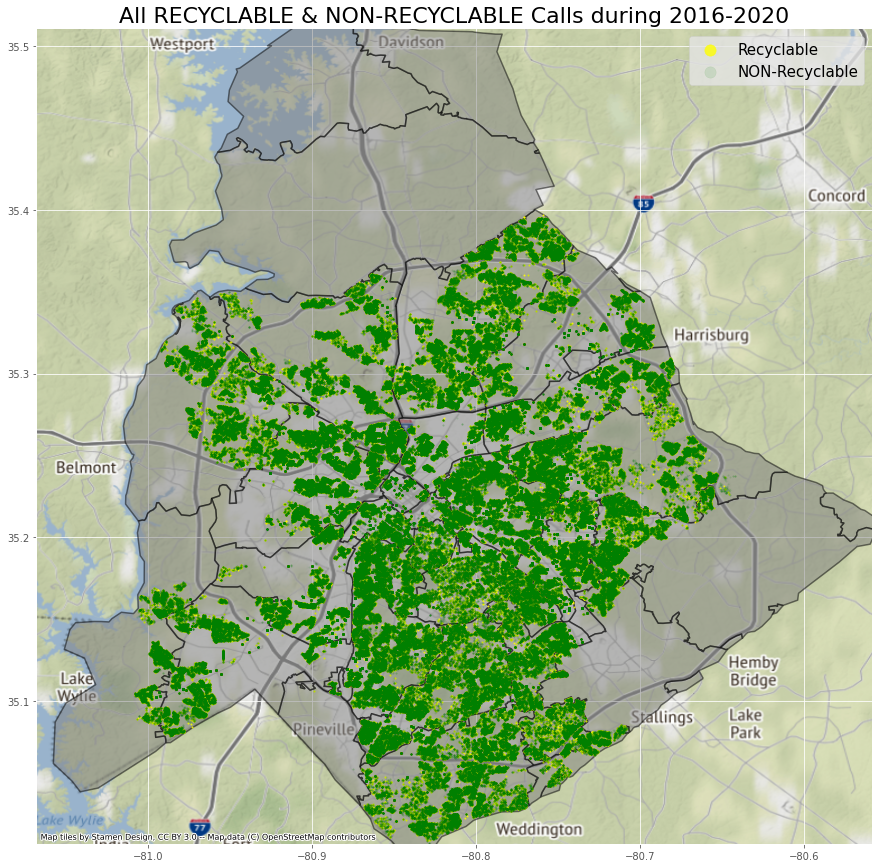

In [65]:
# Layering All Recy & Non-Recy requests onto the ZipCode Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
charlotte_zipcode_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all Recycle 311-Calls
recy_year_all.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'Recyclable')

# Plot 3 - Map all NON Recycle 311-Calls
non_recy_year_all.plot(ax=ax, 
                    color='green',
                    markersize=2,
                    alpha=0.1,
                    aspect = 1,
                    label = 'NON-Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('All RECYCLABLE & NON-RECYCLABLE Calls during 2016-2020',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = charlotte_zipcode_map.crs.to_string())

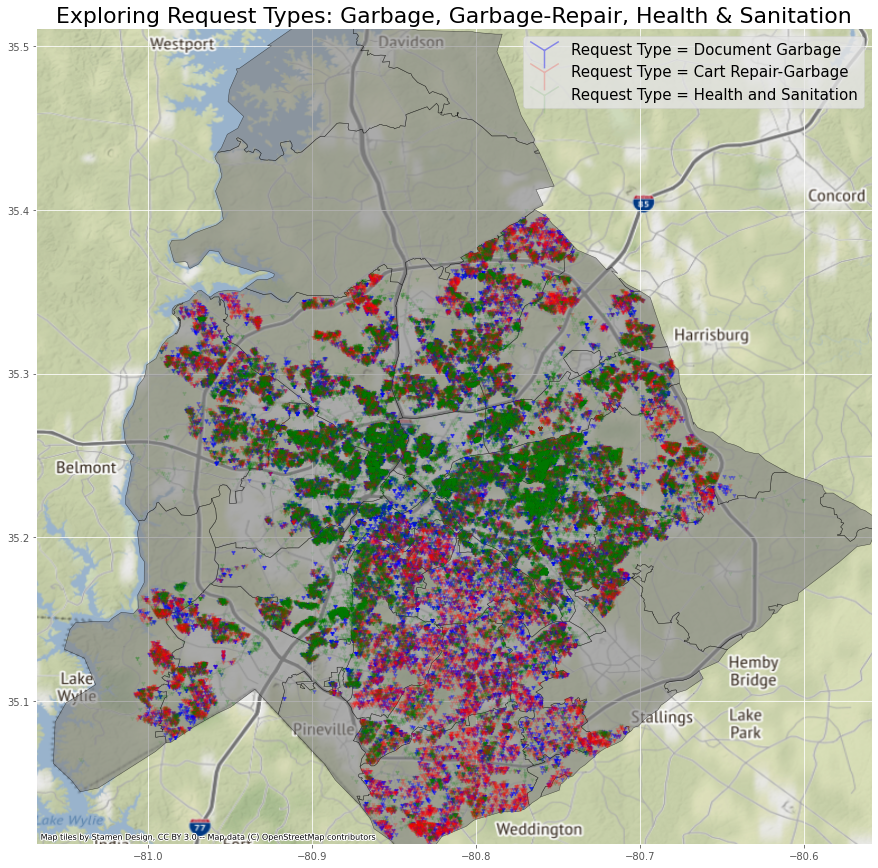

In [66]:
fig,ax = plt.subplots(figsize = (15,15))

charlotte_zipcode_map.plot(ax= ax, 
                           color='grey', 
                           edgecolor='black', 
                           alpha =0.6, 
                           lw=0.5)
        
# Plot 1
geo_requests[geo_requests['REQUEST_TYPE'] == 'SW DOCUMENT GARBAGE'].plot(ax = ax, 
                                                                         markersize = 20, 
                                                                         color = 'blue', 
                                                                         marker = '1', 
                                                                         label = 'Request Type = Document Garbage', 
                                                                         alpha =0.4, 
                                                                         aspect=1)


# Plot 2
geo_requests[geo_requests['REQUEST_TYPE'] == 'CART REPAIR-GARBAGE'].plot(ax = ax, 
                                                                         markersize = 20, 
                                                                         color = 'red', 
                                                                         marker = '1', 
                                                                         label = 'Request Type = Cart Repair-Garbage', 
                                                                         alpha =0.2, 
                                                                         aspect=1)

# Plot 3
geo_requests[geo_requests['REQUEST_TYPE'] == 'HNS HEALTH AND SANITATION'].plot(ax = ax, 
                                                                               markersize = 20, 
                                                                               color = 'green', 
                                                                               marker = '1', 
                                                                               label = 'Request Type = Health and Sanitation', 
                                                                               alpha =0.1, 
                                                                               aspect=1)


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)

ax.set_title('Exploring Request Types: Garbage, Garbage-Repair, Health & Sanitation',fontsize=22)

#adds in the highway background 
ctx.add_basemap(ax, crs=charlotte_zipcode_map.crs.to_string())

<h2> Data Preprocessing </h2>

<h2> Data Understanding and Exploration </h2>

<h2> Data Preparation for Modeling </h2>

<h2> Modeling </h2>

<h2> Evaluation </h2>

<h2> Results </h2>